# Comparison of different MPI calibrations

I did several MPI calibrations :
- between nodes `taurus-15` and `taurus-5`,
- between nodes `taurus-6` and `taurus-8`,
- between nodes `nova-8` and `nova-9`.

In this notebook, I try to see if we can identify any difference, and how.

In [1]:
import pandas
import altair
import pytree
import os
print(pytree.__version__, pytree.__git_version__)

0.0.2 1d3b42da23e230f3e79ca9381471a91e96d20c6b


# Utility functions

These are used to build the dataframes from the archive content.

In [2]:
import zipfile
import io


def extract_zip(zip_name):
    '''Taken from https://stackoverflow.com/a/10909016/4110059'''
    input_zip = zipfile.ZipFile(zip_name)
    result = {}
    for name in input_zip.namelist():
        dataframe = pandas.read_csv(io.BytesIO(input_zip.read(name)), names = ['op', 'msg_size', 'start', 'duration'])
        dataframe['experiment'] = zip_name
        dataframe['type'] = name
        result[name] = dataframe
    del result['exp/']
    return result


def extract_folder(folder_name):
    result = {}
    for root, dirs, files in os.walk(folder_name):
        for file in files:
            if file.endswith(".zip"):
                filename = os.path.join(root, file)
                result[filename] = extract_zip(filename)
    return result


def aggregate_dataframe(dataframe):
    df = dataframe.groupby('msg_size').mean().reset_index()
    df['experiment'] = dataframe['experiment'].unique()[0]
    return df


def sample_dataframe(dataframe):
    return dataframe.sample(frac=0.03)


def merge_dataframes(folder_dict, dataframe_name, dataframe_processing=lambda x: x):
    all_df = []
    for folder, dataframes in folder_dict.items():
        all_df.append(dataframe_processing(dataframes[dataframe_name]))
    return pandas.concat(all_df)

In [3]:
dataframes = extract_folder('results')
all_experiments = list(dataframes.keys())
alldf = merge_dataframes(dataframes, 'exp/exp_Recv.csv')
print(len(alldf))
print(alldf.head())
print()
print('\n'.join(all_experiments))

99300
         op  msg_size     start  duration  \
0  MPI_Recv    765921  0.011761  0.001331   
1  MPI_Recv    765921  0.018230  0.001163   
2  MPI_Recv    765921  0.024471  0.001105   
3  MPI_Recv    765921  0.030707  0.001025   
4  MPI_Recv    765921  0.036854  0.001103   

                             experiment              type  
0  results/nova-8-nova-9_2018-06-13.zip  exp/exp_Recv.csv  
1  results/nova-8-nova-9_2018-06-13.zip  exp/exp_Recv.csv  
2  results/nova-8-nova-9_2018-06-13.zip  exp/exp_Recv.csv  
3  results/nova-8-nova-9_2018-06-13.zip  exp/exp_Recv.csv  
4  results/nova-8-nova-9_2018-06-13.zip  exp/exp_Recv.csv  

results/nova-8-nova-9_2018-06-13.zip
results/taurus-6-taurus-8_2018-06-08.zip
results/taurus-15-taurus-5_2018-06-08.zip


# Plot of the datasets

Note: these plots are interactive, try to select and move an interval in one of them.

In [4]:
import altair as alt

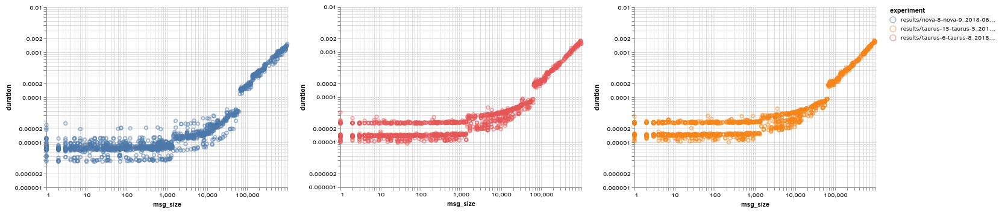

In [5]:
# alt.data_transformers.enable('csv')
def do_plot(y_col, log_y=True):
    ydomain = [min(alldf[y_col]), max(alldf[y_col])]
    brush = alt.selection_interval(encodings=['x'])
    if log_y:
        scale = alt.Scale(type='log', domain=ydomain)
    else:
        scale = alt.Scale(domain=ydomain)

    chart = alt.Chart(alldf.sample(n=5000)).mark_point(opacity=0.5).encode(   # *IMPORTANT* note that we have sampled the dataframe, for better plot interactivity
        x=alt.X('msg_size', scale=alt.Scale(type='log')),
        y=alt.Y(y_col, scale=scale),
        color=alt.condition(brush, 'experiment', alt.value('lightgray'))
    ).add_selection(
        brush
    )

    final = (
        chart.transform_filter(alt.datum.experiment==all_experiments[0]) |
        chart.transform_filter(alt.datum.experiment==all_experiments[1]) |
        chart.transform_filter(alt.datum.experiment==all_experiments[2])
    )
    return final

do_plot('duration')

# Regressions

First, we compute a regression with aggregated data to find the breakpoints.

In [6]:
df = aggregate_dataframe(extract_zip(all_experiments[-1])['exp/exp_Recv.csv'])
reg = pytree.compute_regression(df.msg_size, df.duration, mode='BIC')
breakpoints = reg.breakpoints
reg.flatify()

-inf < x ≤ 1.382e+03
	y ~ 3.348e-09x + 1.899e-05
1.382e+03 < x ≤ 6.279e+04
	y ~ 1.035e-09x + 2.862e-05
6.279e+04 < x ≤ inf
	y ~ 1.739e-09x + 6.899e-05

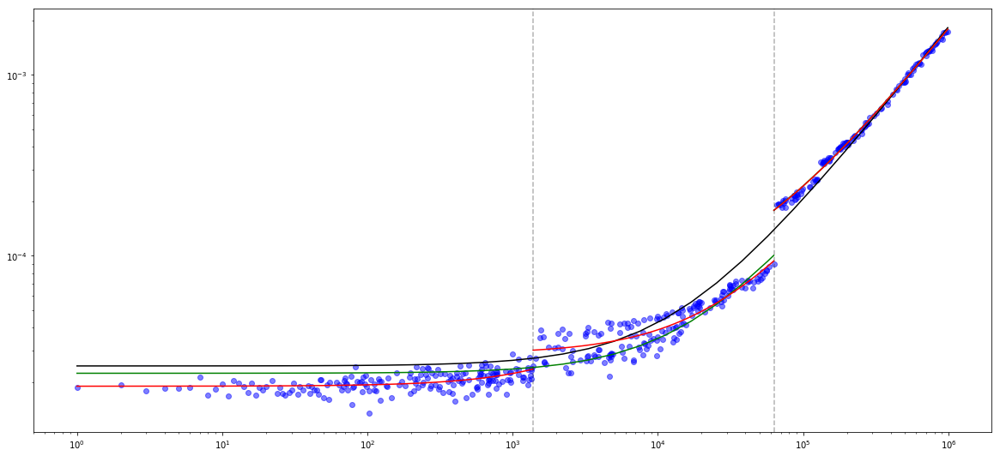

In [7]:
reg.plot_dataset(log=True)

Then we compute a regression on non-aggregated data with the breakpoints we have found.

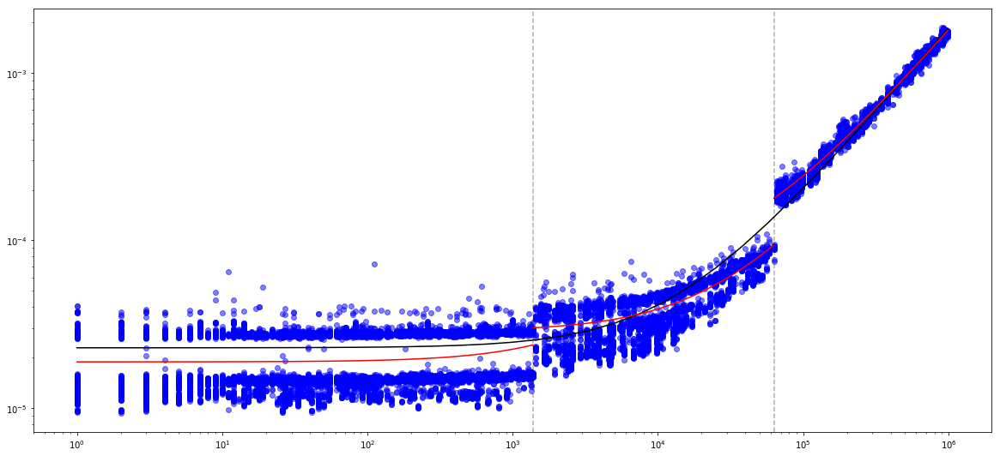

In [8]:
df = extract_zip(all_experiments[-1])['exp/exp_Recv.csv']
reg = pytree.compute_regression(df.msg_size, df.duration, breakpoints=breakpoints)
reg.plot_dataset(log=True)

Now, we compute the residuals for all the datasets with **this** particular regression.

In [9]:
def compute_residuals(df, reg):
    df['predict'] = df.msg_size.apply(reg.predict)
    df['residual'] = df.duration - df.predict
    df['relative_residual'] = df.residual / df.duration
    df['residual_square'] = df.residual ** 2

compute_residuals(alldf, reg)
alldf.head()

,op,msg_size,start,duration,experiment,type,predict,residual,relative_residual,residual_square
0,MPI_Recv,765921,0.011761,0.001331,results/nova-8-nova-9_2018-06-13.zip,exp/exp_Recv.csv,0.001401,-0.000071,-0.052990,4.971716e-09
1,MPI_Recv,765921,0.018230,0.001163,results/nova-8-nova-9_2018-06-13.zip,exp/exp_Recv.csv,0.001401,-0.000239,-0.205185,5.690438e-08
2,MPI_Recv,765921,0.024471,0.001105,results/nova-8-nova-9_2018-06-13.zip,exp/exp_Recv.csv,0.001401,-0.000296,-0.268268,8.783660e-08
3,MPI_Recv,765921,0.030707,0.001025,results/nova-8-nova-9_2018-06-13.zip,exp/exp_Recv.csv,0.001401,-0.000376,-0.367268,1.416509e-07
4,MPI_Recv,765921,0.036854,0.001103,results/nova-8-nova-9_2018-06-13.zip,exp/exp_Recv.csv,0.001401,-0.000298,-0.270249,8.886086e-08


### Plots of the residuals

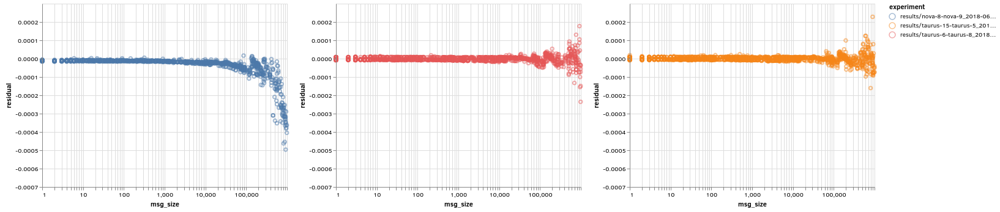

In [10]:
do_plot('residual', log_y=False)

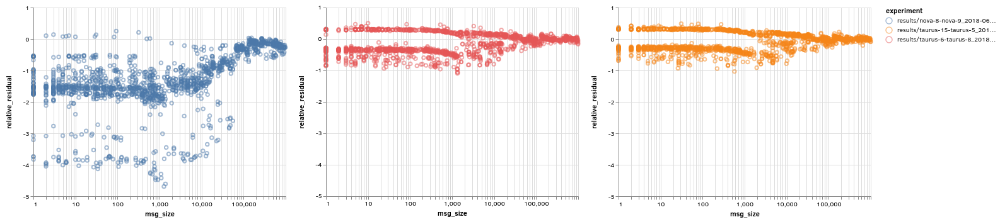

In [11]:
do_plot('relative_residual', log_y=False)

### Statistical tests on the residuals

Houw could we automatically tell if two datasets are significantly different or not? A possibility could be to compare the mean of the squares of the residuals (remainder: this residuals have been obtained with a model computed on a possibly different dataset). One good way to compare two means is to do a t-test. The P-value is the probability for the two means to be equal. Usually, we consider them to be different when the P-value is below a threshold of 5%.

In [12]:
from scipy import stats
def test_residuals(df, exp1, exp2):
    return stats.ttest_ind(df[df.experiment == exp1].residual_square, df[df.experiment == exp2].residual_square)

In [13]:
experiments = list(dataframes.keys())
for exp1 in experiments:
    for exp2 in experiments:
        print('%.4f' % test_residuals(alldf, exp1, exp2).pvalue, end=' ')
    print()

1.0000 0.0000 0.0000 
0.0000 1.0000 0.9528 
0.0000 0.9528 1.0000 


The P-values of the t-test between the `taurus` dataset are above 0.05, so we can consider that the means of the squares of the residuals are equal. In other words, the model we have found for **one** of the datasets fits as well the **other** dataset.

On the other hand, the P-value of the t-test between the `nova` dataset and one of the `taurus` dataset is zero. Therefore, we can consider here that the means of the squares of the residuals are **not** equal. In other words, the model we have found for the `taurus` nodes is not a good fit for the `nova` node: the performance behavior is different.